In [1]:
%reload_ext autoreload
%autoreload 2

import sys
import numpy as np
np.set_printoptions(precision=4, suppress=True)
KITTI_ROOT_PATH = '/home/ruizhu/Documents/Datasets/kitti'
KITTI_PATH = KITTI_ROOT_PATH + '/raw'

sys.path.append(KITTI_ROOT_PATH+'/kitti-lidar-utils')
sys.path.append(KITTI_ROOT_PATH+'/kitti-lidar-utils/source')
sys.path.append(KITTI_ROOT_PATH+'/depth/devkit/python')
import itertools
import pdb
import pykitti  # install using pip install pykitti
import os
from PIL import Image, ImageOps
import imageio
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import time
from source.utils import load_tracklets_for_frames, point_inside, in_hull
from source import parseTrackletXML as xmlParser
from source.kitti_util import *
import argparse
from matplotlib import cm
# from cluster_pcs.filters import *
from math import atan2, degrees
from PIL import Image
from read_depth import *
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import torch

## Select sequence
date_name = '2011_09_26'
seq_name = '_drive_0005_sync'
tracklet_path = KITTI_PATH+'/%s/%s/tracklet_labels.xml'%(date_name, date_name+seq_name)
fdir_path = KITTI_PATH+'/%s/%s/'%(date_name, date_name+seq_name)
if os.path.exists(tracklet_path):
    print('======Tracklet Exists:', tracklet_path)
else:
    print('======Tracklet NOT Exists:', tracklet_path)
    
## Raw Data directory information
path = fdir_path.rstrip('/')
basedir = path.rsplit('/',2)[0]
date = path.split('/')[-2]
drive = path.split('/')[-1].split('_')[-2]

dataset = pykitti.raw(basedir, date, drive)
tracklet_rects, tracklet_types, tracklet_ids, tracklet_Rs, tracklet_ts = load_tracklets_for_frames(len(list(dataset.velo)),\
               '{}/{}/{}_drive_{}_sync/tracklet_labels.xml'.format(basedir,date, date, drive))
dataset_gray = list(dataset.gray)
dataset_rgb = list(dataset.rgb) 

## From Rui
# Understanding calibs: https://github.com/utiasSTARS/pykitti/blob/0e5fd7fefa7cd10bbdfb5bd131bb58481d481116/pykitti/raw.py#L150
cam = 'leftRGB'
P_rects = {'leftRGB':dataset.calib.P_rect_20, 'rightRGB':dataset.calib.P_rect_30} # cameras def.: https://github.com/utiasSTARS/pykitti/blob/19d29b665ac4787a10306bbbbf8831181b38eb38/pykitti/odometry.py#L42
cam2cam = {}
R_cam2rect = dataset.calib.R_rect_00 # [cam0] R_rect_xx: 3x3 rectifying rotation to make image planes co-planar
P_rect = P_rects['leftRGB'] # P_rect_0[0-3]: 3x4 projection matrix after rectification; the reprojection matrix in MV3D
velo2cam = dataset.calib.T_cam0_velo_unrect
P_velo2im = np.dot(np.dot(P_rect, R_cam2rect), velo2cam) # 4*3

## Help functions and plot params
fig_scale = 300
fig_ratio = [4, 3]
im_shape = [375, 1242]

# https://github.com/vcg-uvic/learned-correspondence-release/blob/16bef8a0293c042c0bd42f067d7597b8e84ef51a/network.py#L160
def torch_skew_symmetric(v): # v: [3, 1]
    zero = torch.zeros_like(v[0, 0])
    M = torch.stack([
        zero, -v[2, 0], v[1, 0],
        v[2, 0], zero, -v[0, 0],
        -v[1, 0], v[0, 0], zero,
    ], dim=0)
    return torch.reshape(M, (3, 3))

def scatter_xy(xy, c, im_shape, title=''):
    plt.figure(figsize=(30, 8))
    plt.scatter(xy[:, 0], xy[:, 1], s=2, c=c)
    plt.colorbar()
    plt.xlim(0, im_shape[1]-1)
    plt.ylim(im_shape[0]-1, 0)
    plt.title(title)
    plt.show()
    val_inds = (xy[:, 0] >= 0) & (xy[:, 1] >= 0)
    val_inds = val_inds & (xy[:,0] < im_shape[1]) & (xy[:,1] < im_shape[0])
    return val_inds

def homo_th(x):
    # input: x [N, 2]
    # output: x_homo [N, 3]
    N = list(x.size())[0]
    x_homo = torch.cat((x, torch.ones(N, 1, dtype=x.dtype)), 1)
    return x_homo

def de_homo_th(x_homo):
    # input: x_homo [N, 3]
    # output: x [N, 2]
    N = list(x_homo.size())[0]
    epi = 1e-10
    x = torch.cat((x_homo[:, 0:1]/(x_homo[:, 2:3]+epi), x_homo[:, 1:2]/(x_homo[:, 2:3]+epi)), 1)
    return x

def homo_np(x):
    # input: x [N, D]
    # output: x_homo [N, D+1]
    N = x.shape[0]
    x_homo = np.hstack((x, np.ones((N, 1))))
    return x_homo

def de_homo_np(x_homo):
    # input: x_homo [N, D]
    # output: x [N, D-1]
    N = x_homo.shape[0]
    epi = 1e-10
    x = np.hstack((x_homo[:, 0:1]/(x_homo[:, 2:3]+epi), x_homo[:, 1:2]/(x_homo[:, 2:3]+epi)))
    return x

======Tracklet Exists: /home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/tracklet_labels.xml
Parsing tracklet file /home/ruizhu/Documents/Datasets/kitti/raw/2011_09_26/2011_09_26_drive_0005_sync/tracklet_labels.xml
File contains 15 tracklets
Loaded 15 tracklets.


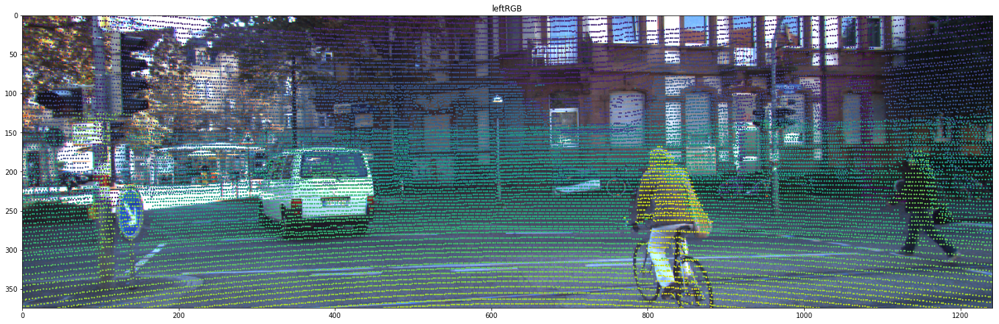

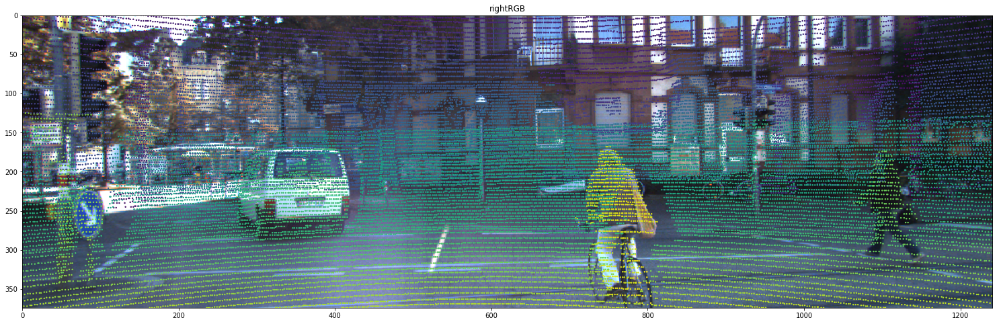

In [2]:
i = 0
velo = list(dataset.velo)[i] # [N, 4]
# project the points to the camera
velo = velo[:, :3]
velo_reproj = homo_np(velo)

for cam_iter, cam in enumerate(['leftRGB', 'rightRGB']):
    P_rect = P_rects[cam] # P_rect_0[0-3]: 3x4 projection matrix after rectification; the reprojection matrix in MV3D
    P_velo2im = np.dot(np.dot(P_rect, R_cam2rect), velo2cam) # 4*3

    velo_pts_im = np.dot(P_velo2im, velo_reproj.T).T # [*, 3]
    velo_pts_im[:, :2] = velo_pts_im[:,:2] / velo_pts_im[:,2][..., np.newaxis]

#     velo_pts_im_list.append(velo_pts_im.copy())

    # check if in bounds
    # use minus 1 to get the exact same value as KITTI matlab code
    velo_pts_im[:, 0] = np.round(velo_pts_im[:,0]) - 1
    velo_pts_im[:, 1] = np.round(velo_pts_im[:,1]) - 1
    val_inds = (velo_pts_im[:, 0] >= 0) & (velo_pts_im[:, 1] >= 0)
    val_inds = val_inds & (velo_pts_im[:,0] < im_shape[1]) & (velo_pts_im[:,1] < im_shape[0])
    velo_pts_im = velo_pts_im[val_inds, :]

    plt.figure(figsize=(30, 8))
    plt.imshow(dataset_rgb[i][cam_iter])
    plt.scatter(velo_pts_im[:, 0].astype(np.int), velo_pts_im[:, 1].astype(np.int), s=2, c=1./velo_pts_im[:, 2])
    plt.xlim(0, im_shape[1]-1)
    plt.ylim(im_shape[0]-1, 0)
    plt.title(cam)
    plt.show()

# Left/right setting
## Rectified cameras and points

[[721.5377   0.     609.5593  44.8573]
 [  0.     721.5377 172.854    0.2164]
 [  0.       0.       1.       0.0027]]
[[ 721.5377    0.      609.5593 -339.5242]
 [   0.      721.5377  172.854     2.1999]
 [   0.        0.        1.        0.0027]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[ 0.0598]
 [-0.0004]
 [ 0.0027]]
[[-0.4729]
 [ 0.0024]
 [ 0.0027]]
(3, 123397)
(3, 60242)


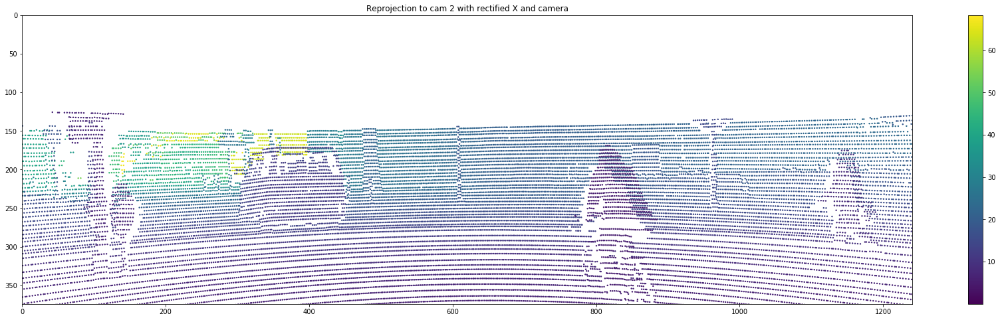

(60242,)
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]] [[-0.5327]
 [ 0.0028]
 [-0.    ]]


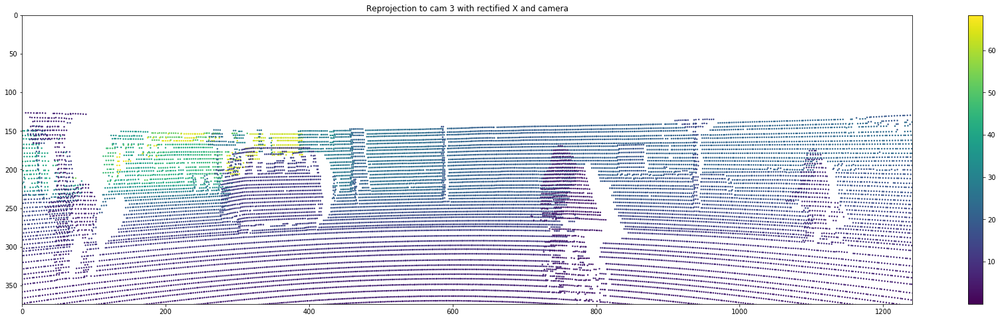

(60242,)
(60242,)


In [3]:
print(dataset.calib.P_rect_20)
print(dataset.calib.P_rect_30)
K = dataset.calib.P_rect_20[:3, :3]
K_th = torch.from_numpy(K)
M1_gt = np.matmul(np.linalg.inv(K), dataset.calib.P_rect_20)
M2_gt = np.matmul(np.linalg.inv(K), dataset.calib.P_rect_30)

t1_gt = M1_gt[:, 3:4]
t2_gt = M2_gt[:, 3:4]
R1_gt = M1_gt[:, :3]
R2_gt = M2_gt[:, :3]
print(R1_gt)
print(R2_gt)
print(t1_gt)
print(t2_gt)

val_inds_list = []

X_homo = np.dot(np.dot(R_cam2rect, velo2cam), velo_reproj.T) # 4*N
R1t1_gt = np.vstack((np.hstack((R1_gt, t1_gt)), np.array([0., 0., 0., 1.], dtype=np.float64)))
X_homo_rect = np.matmul(R1t1_gt, X_homo)
X_rect = X_homo_rect[:3, :] / X_homo_rect[3:4, :]

front_mask = X_rect[-1, :]>0
print(X_rect.shape)
X_rect = X_rect[:, front_mask]
print(X_rect.shape)
X_homo_rect = X_homo_rect[:, front_mask]
# velo_pts_im_list[0] = velo_pts_im_list[0][front_mask, :]
# velo_pts_im_list[1] = velo_pts_im_list[1][front_mask, :]

# Plot with recfitied X and R, t
x1_homo = np.matmul(K, np.matmul(np.hstack((np.eye(3), np.zeros((3, 1)))), X_homo_rect)).T
x1 = x1_homo[:, 0:2]/x1_homo[:, 2:3]
val_inds = scatter_xy(x1, x1_homo[:, 2], im_shape, 'Reprojection to cam 2 with rectified X and camera')
print(val_inds.shape)
val_inds_list.append(val_inds)

delta_Rt_gt = np.matmul(np.hstack((R2_gt, t2_gt)), np.linalg.inv(R1t1_gt))
delta_R_gt = delta_Rt_gt[:, :3]
delta_t_gt = delta_Rt_gt[:, 3:4]
print(delta_R_gt, delta_t_gt)
t_gt_x = torch_skew_symmetric(torch.from_numpy(delta_t_gt).float())
E_gt_th = torch.matmul(t_gt_x, torch.eye(3)).to(torch.float64)
F_gt_th = torch.matmul(torch.matmul(torch.inverse(K_th).t(), E_gt_th), torch.inverse(K_th))

x2_homo = np.matmul(K, np.matmul(np.hstack((delta_R_gt, delta_t_gt)), X_homo_rect)).T
x2 = x2_homo[:, :2]/x2_homo[:, 2:3]
val_inds = scatter_xy(x2, x2_homo[:, 2], im_shape, 'Reprojection to cam 3 with rectified X and camera')
print(val_inds.shape)
val_inds_list.append(val_inds)

val_inds_both = val_inds_list[0] & val_inds_list[1]
print(val_inds_both.shape)
val_idxes = [idx for idx in range(val_inds_both.shape[0]) if val_inds_both[idx]] # within indexes

## Keypoint detection and matching

# kps: 3420, descriptors: (3420, 128)
# kps: 3159, descriptors: (3159, 128)


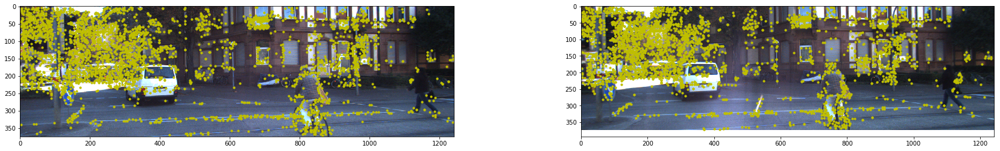

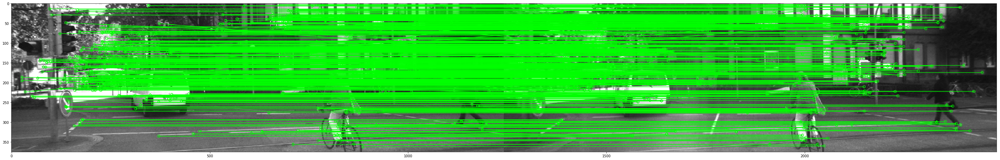

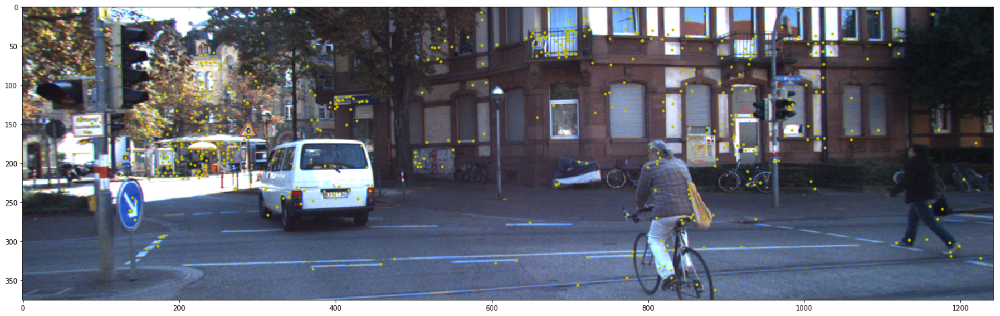

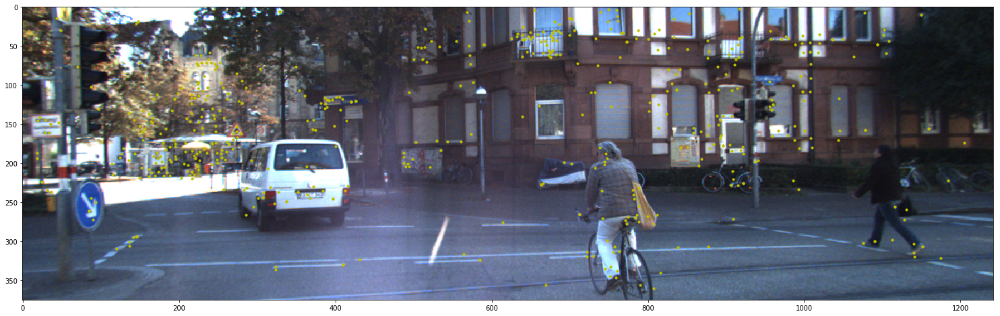

In [115]:
%reload_ext autoreload
%autoreload 2

def show_kp(img, x, scale=1):
    plt.figure(figsize=(30*scale, 8*scale))
    plt.imshow(img)
    plt.scatter(x[:, 0], x[:, 1], s=10, marker='o', c='y')
    plt.show()

import cv2
MIN_MATCH_COUNT = 10

# img1 = cv2.imread('0000000000_0.png',0) # queryImage
img1_rgb = np.array(dataset_rgb[i][0])
img1 = cv2.cvtColor(img1_rgb, cv2.COLOR_BGR2GRAY)
img2_rgb = np.array(dataset_rgb[i][1])
img2 = cv2.cvtColor(img2_rgb, cv2.COLOR_BGR2GRAY)

# Initiate SIFT detector
# pip install opencv-python==3.4.2.16, opencv-contrib-python==3.4.2.16
# https://www.pyimagesearch.com/2015/07/16/where-did-sift-and-surf-go-in-opencv-3/
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
print("# kps: {}, descriptors: {}".format(len(kp1), des1.shape))
x1_all = np.array([p.pt for p in kp1])
# show_kp(img1_rgb, x1_all, 0.5)

kp2, des2 = sift.detectAndCompute(img2,None)
print("# kps: {}, descriptors: {}".format(len(kp2), des2.shape))
x2_all = np.array([p.pt for p in kp2])
# show_kp(img2_rgb, x2_all, 0.5)

plt.figure(figsize=(30, 4))
plt.subplot(121)
plt.imshow(img1_rgb)
plt.scatter(x1_all[:, 0], x1_all[:, 1], s=10, marker='o', c='y')
plt.subplot(122)
plt.imshow(img2_rgb)
plt.scatter(x2_all[:, 0], x2_all[:, 1], s=10, marker='o', c='y')
plt.show()

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1,des2,k=2) # another option is https://github.com/MagicLeapResearch/SuperPointPretrainedNetwork/blob/master/demo_superpoint.py#L309
# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = None, # draw only inliers
                   flags = 2)

img3 = cv2.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)

plt.figure(figsize=(60, 8))
plt.imshow(img3, 'gray')
plt.show()

x1 = x1_all[[mat.queryIdx for mat in good], :]
plt.figure(figsize=(30, 8))
plt.imshow(img1_rgb)
plt.scatter(x1[:, 0], x1[:, 1], s=10, marker='o', c='y')
plt.show()

x2 = x2_all[[mat.trainIdx for mat in good], :]
plt.figure(figsize=(30, 8))
plt.imshow(img2_rgb)
plt.scatter(x2[:, 0], x2[:, 1], s=10, marker='o', c='y')
plt.show()

assert x1.shape == x2.shape

## Plot epipolar constraint by OpenCV and Rui's implementations

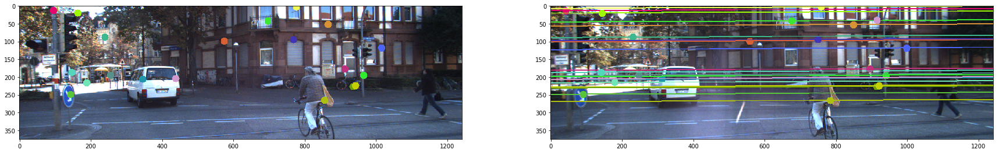

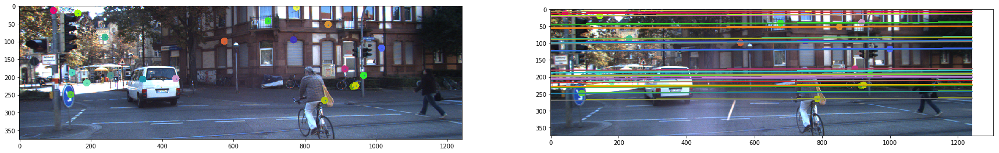

In [116]:
# pts1 = np.int32(x1)
# pts2 = np.int32(x2)
# F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
F_gt = F_gt_th.numpy()
# # We select only inlier points
# pts1 = pts1[mask.ravel()==1]
# pts2 = pts2[mask.ravel()==1]

## By OpenCV
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape[:2]
#     img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
#     img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,2)
        img1 = cv2.circle(img1,tuple(pt1),10,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),10,color,-1)
    return img1,img2

import random
random.seed(10)
N_points = 20
random_idx = random.sample(range(x1.shape[0]), N_points)
x1_sample = x1[random_idx, :]
x2_sample = x2[random_idx, :]

lines2 = cv2.computeCorrespondEpilines(x1_sample.reshape(-1,1,2).astype(int), 1,F_gt)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img2_rgb,img1_rgb,lines2,x2_sample.astype(int),x1_sample.astype(int))

plt.figure(figsize=(30, 8))
plt.subplot(121),plt.imshow(img4)
plt.subplot(122),plt.imshow(img3)
plt.show()

## By Rui
x1_sample_homo = homo_np(x1_sample)
x2_sample_homo = homo_np(x2_sample)
right_P = np.matmul(F, x1_sample_homo.T)
right_epipolar_x = np.tile(np.array([[0], [1]]), N_points) * im_shape[1]
# Using the eqn of line: ax+by+c=0; y = (-c-ax)/b, http://ai.stanford.edu/~mitul/cs223b/draw_epipolar.m
right_epipolar_y = (-right_P[2:3, :] - right_P[0:1, :] * right_epipolar_x) / right_P[1:2, :]

plt.figure(figsize=(30, 8))
plt.subplot(121)
plt.imshow(img1_rgb), plt.scatter(x1_sample[:, 0], x1_sample[:, 1], s=1)
plt.subplot(122)
plt.imshow(img2_rgb)
plt.plot(right_epipolar_x, right_epipolar_y)
plt.scatter(x2_sample[:, 0], x2_sample[:, 1], s=1)
plt.show()

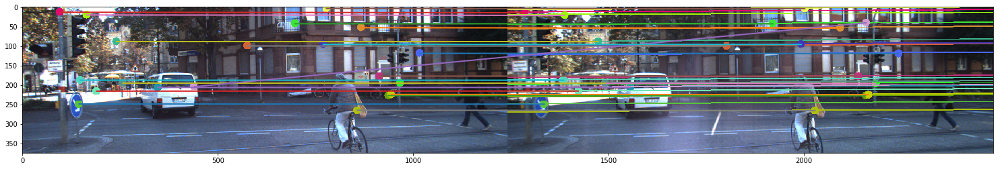

In [140]:
def draw_corr(im1, im2, x1, x2, linewidth):
    # im1 = img1_rgb
    # im2 = img2_rgb
    # x1 = x1_sample
    # x2 = x2_sample
    x2_copy = x2.copy()
    x2_copy[:, 0] = x2_copy[:, 0] + im_shape[1]
    im12 = np.hstack((im1, im2))

    plt.figure(figsize=(30, 4))
    plt.imshow(im12)
    plt.plot(np.vstack((x1[:, 0], x2_copy[:, 0])), np.vstack((x1[:, 1], x2_copy[:, 1])), linewidth=linewidth)
    plt.show()
    
draw_corr(img1_rgb, img2_rgb, x1_sample, x2_sample, 2)

## Compute the Sampson distance
Multiplt View Geometry book, pg. 287, equ. 11.9, also https://github.com/marktao99/python/blob/master/CVP/samples/sfm.py#L216 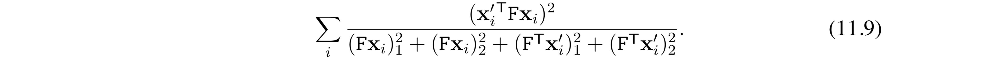

[    0.0257     0.4968     0.093      0.3813     0.0157     0.0002
     0.028      0.0436     0.0098     0.         0.0626     0.1601
     0.0039     0.0577 13111.5342     0.0554     0.3981     0.1487
     0.001      0.0096]


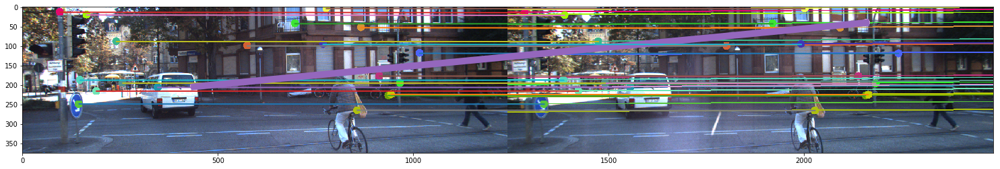

In [152]:
x1_sample_homo_th = torch.from_numpy(x1_sample_homo)
x2_sample_homo_th = torch.from_numpy(x2_sample_homo)
nominator = (torch.diag(torch.matmul(torch.matmul(x2_sample_homo_th, F_gt_th), x1_sample_homo_th.t())))**2
Fx1 = torch.mm(F_gt_th, x1_sample_homo_th.t())
Fx2 = torch.mm(F_gt_th, x2_sample_homo_th.t())
denom = Fx1[0]**2 + Fx1[1]**2 + Fx2[0]**2 + Fx2[1]**2
error = nominator/denom
print(error.numpy())

def draw_corr_widths(im1, im2, x1, x2, linewidth):
    # im1 = img1_rgb
    # im2 = img2_rgb
    # x1 = x1_sample
    # x2 = x2_sample
    x2_copy = x2.copy()
    x2_copy[:, 0] = x2_copy[:, 0] + im_shape[1]
    im12 = np.hstack((im1, im2))

    plt.figure(figsize=(30, 4))
    plt.imshow(im12)
    for i in range(x1.shape[0]):
        width = 2 if linewidth[i]<5 else 10
        plt.plot(np.vstack((x1[i, 0], x2_copy[i, 0])), np.vstack((x1[i, 1], x2_copy[i, 1])), linewidth=width)
    plt.show()
draw_corr_widths(img1_rgb, img2_rgb, x1_sample, x2_sample, error.numpy())

In [143]:
%reload_ext autoreload
%autoreload 2
np.set_printoptions(precision=8, suppress=True)

from dsac.H_loss import HLoss
from dsac.dsac import DSAC
import dsac.utils as utils

x1_th = torch.from_numpy(x1)
x2_th = torch.from_numpy(x2)
x1_homo_th = homo_th(x1_th)
x2_homo_th = homo_th(x2_th)

E_est_th = utils.E_from_XY(x1_th, x2_th)
# E_gt_th = E_gt.to(torch.float64)

print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt)).numpy())
print(E_gt.numpy())

# K_th = torch.from_numpy(K)
# F = torch.matmul(torch.matmul(torch.inverse(K_th).t(), E_gt_th), torch.inverse(K_th))
# print(F)
should_zeros = torch.diag(torch.matmul(torch.matmul(x2_homo_th, F_gt_th), x1_homo_th.t())).numpy()
# print(should_zeros*1e17==0.)
mask = should_zeros*1e30==0.
print(np.sum(mask))

print(mask.shape, x2_homo.shape)
# mask_th = torch.from_numpy(mask)
x2_homo_th_new = torch.from_numpy(homo_np(x2)[mask, :])
print(x2_homo_th_new.shape)
x1_homo_th_new = torch.from_numpy(homo_np(x1)[mask, :])
should_zeros2 = torch.diag(torch.matmul(torch.matmul(x2_homo_th_new, F), x1_homo_th_new.t())).numpy()
print(should_zeros2)

x2_homo_th_new = torch.from_numpy(homo_np(x2))
print(x2_homo_th_new.shape)
x1_homo_th_new = torch.from_numpy(homo_np(x1))
should_zeros2 = torch.diag(torch.matmul(torch.matmul(x2_homo_th_new, F), x1_homo_th_new.t())).numpy()
print(should_zeros2)

[[ 0.10315249 -0.35426767 -0.00080397]
 [-0.10741558  0.36892401 -0.00179174]
 [-0.00102955  0.00046627  0.53271474]]
[[ 0.          0.00001598  0.0027529 ]
 [-0.00001598  0.          0.5327119 ]
 [-0.0027529  -0.5327119   0.        ]]
tensor([[ 0.0000e+00,  3.0692e-11,  3.8100e-06],
        [-3.0692e-11,  0.0000e+00,  7.3832e-04],
        [-3.8100e-06, -7.3832e-04,  0.0000e+00]], dtype=torch.float64)
142
(579,) (60242, 3)
torch.Size([142, 3])
[-0.00045418  0.00064473  0.00062949 -0.00046695 -0.00001379  0.00053829
  0.00003375  0.00003375 -0.00037529 -0.00037529 -0.00179114 -0.00000056
  0.00065878  0.00004411 -0.0000719   0.00010774  0.00010521 -0.0001017
 -0.00008168 -0.00008136  0.00101883 -0.00005425 -0.00003354 -0.00003354
 -0.00008136 -0.00008136 -0.00002223 -0.00015755  0.00027869  0.00001637
 -0.00026258  0.00008817  0.00033994  0.00029113 -0.00004343  0.00027399
  0.00027399  0.0000307   0.00035752  0.00000021  0.00042095 -0.00003227
 -0.00000915 -0.00028656  0.00018271  0.00

In [146]:
E_est_th = utils.E_from_XY(torch.from_numpy(x1[mask, :]), torch.from_numpy(x2[mask, :]))
print((E_est_th / torch.norm(E_est_th) * torch.norm(E_gt)).numpy())
print(E_gt.numpy())

[[ 0.00000219  0.00023177 -0.0149192 ]
 [-0.00038858  0.00284302  0.53250241]
 [ 0.01486823 -0.53250383  0.00284515]]
[[ 0.          0.00001598  0.0027529 ]
 [-0.00001598  0.          0.5327119 ]
 [-0.0027529  -0.5327119   0.        ]]


In [140]:
print(x1.shape)

(579, 2)


In [136]:
print(x2_homo_th.shape)

torch.Size([579, 3])


In [128]:
print(np.sum(mask))

142


In [36]:
print(good[0].queryIdx)

139


In [39]:
print(kp1[0].pt)

(2.5537850856781006, 57.93900680541992)
